- replace cost minimization process by original test txts
- replace lstm prediction to ver 22
- cancel ensemble
- add leak postprocess
- modify floor predictions by mode value
- change s2g postprocess threshold to 7

In [1]:
import json
import re
import gc
import pickle
import itertools
import pandas as pd
import numpy as np
from glob import glob
from datetime import datetime as dt
from pathlib import Path
from tqdm import tqdm
import datetime
ts_conv = np.vectorize(datetime.datetime.fromtimestamp) # ut(10 digit) -> date

from scipy.spatial.distance import cdist

# pandas settings -----------------------------------------
pd.set_option("display.max_colwidth", 100)
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.options.display.float_format = '{:,.5f}'.format

# Graph drawing -------------------------------------------
import matplotlib
from matplotlib import font_manager
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib import rc
from matplotlib_venn import venn2, venn2_circles
from matplotlib import animation as ani
from IPython.display import Image
from pylab import imread

plt.rcParams["patch.force_edgecolor"] = True
from IPython.display import display # Allows the use of display() for DataFrames
import seaborn as sns
sns.set(style="whitegrid", palette="muted", color_codes=True)
sns.set_style("whitegrid", {'grid.linestyle': '--'})
red = sns.xkcd_rgb["light red"]
green = sns.xkcd_rgb["medium green"]
blue = sns.xkcd_rgb["denim blue"]

%matplotlib inline
%config InlineBackend.figure_format='retina'

# ML -------------------------------------------
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.simplefilter('ignore')

# read prediction

In [2]:
sub_v17 = pd.read_csv('../input/my-indoor-past-predictions/submission_bef_pp_v17.csv')
sub_v20 = pd.read_csv('../input/my-indoor-past-predictions/submission_bef_pp_v20.csv')
sub_v21 = pd.read_csv('../input/my-indoor-past-predictions/submission_bef_pp_v21.csv')
# set your latest submission file here (lstm version 22)
sub_v22 = pd.read_csv('../input/lstm-prediction-dataset/submission_bef_pp.csv')

In [3]:
sub = sub_v22.copy()
#sub["x"] = (sub_v21["x"] + sub_v22["x"]) / 2
#sub["y"] = (sub_v21["y"] + sub_v22["y"]) / 2

# check prediction

In [4]:
# modify floor predictions
sub["path"] = sub["site_path_timestamp"].apply(lambda x:x.split('_')[1])
tmp = sub.groupby("path")["floor"].nunique().reset_index()
multi_floor_path = tmp[tmp.floor!=1]["path"].values

for i in multi_floor_path:
    print(i, int(sub[sub.path == i]["floor"].mode()))
    print(sub[sub.path == i]["floor"].value_counts())
    value = int(sub[sub.path == i]["floor"].mode())
    sub.loc[sub.path==i, "floor"] = value

15d9cd90a0c1d8c0b2e060f8 1
1    26
2     9
0     1
Name: floor, dtype: int64
310990c10f799a9b21cd4ff3 4
4    16
3     3
Name: floor, dtype: int64
47a960ef9f70f0b662d9d244 5
5    12
4     1
Name: floor, dtype: int64
4c93f4e157d7e283547f1153 3
3    17
2     1
Name: floor, dtype: int64
507749a1187be5b582671c62 2
2    9
1    1
Name: floor, dtype: int64
50f24c8ed539bdc44ebf1dd8 4
4    8
3    1
Name: floor, dtype: int64
723900eb4d292e35981c3012 4
4    10
3     4
Name: floor, dtype: int64
7276fac9b55aa417322e20f8 3
3    18
2     1
Name: floor, dtype: int64
7d401b038d6fdb08f4f8197d 1
1    17
0    11
2     1
Name: floor, dtype: int64
862a4ac32755d252c6948424 4
 4    42
 3     6
-1     3
Name: floor, dtype: int64
876cd27fc8f63a2800fc3de8 2
2    58
3     1
Name: floor, dtype: int64
8c1a179f5e2fa18a0307a9dd 0
0    16
2     1
Name: floor, dtype: int64
8ca7fe022118929860699a2f 0
 0    23
-1     1
Name: floor, dtype: int64
9eab95aa6e3838f3fbccf311 3
3    9
4    2
Name: floor, dtype: int64
c816924dba6

In [5]:
for i in multi_floor_path:
    print(sub[sub.path == i]["floor"].value_counts())
sub.drop("path", axis=1, inplace=True)

1    36
Name: floor, dtype: int64
4    19
Name: floor, dtype: int64
5    13
Name: floor, dtype: int64
3    18
Name: floor, dtype: int64
2    10
Name: floor, dtype: int64
4    9
Name: floor, dtype: int64
4    14
Name: floor, dtype: int64
3    19
Name: floor, dtype: int64
1    29
Name: floor, dtype: int64
4    51
Name: floor, dtype: int64
2    59
Name: floor, dtype: int64
0    17
Name: floor, dtype: int64
0    24
Name: floor, dtype: int64
3    11
Name: floor, dtype: int64
2    41
Name: floor, dtype: int64
6    16
Name: floor, dtype: int64
6    13
Name: floor, dtype: int64
4    17
Name: floor, dtype: int64


# cost minimization with magn
- https://www.kaggle.com/museas/with-magn-cost-minimization

In [6]:
!git clone --depth 1 https://github.com/location-competition/indoor-location-competition-20 indoor_location_competition_20
!rm -rf indoor_location_competition_20/data

Cloning into 'indoor_location_competition_20'...
remote: Enumerating objects: 1169, done.
remote: Counting objects: 100% (1169/1169), done.
remote: Compressing objects: 100% (1131/1131), done.
remote: Total 1169 (delta 38), reused 1167 (delta 38), pack-reused 0
Receiving objects: 100% (1169/1169), 411.37 MiB | 18.43 MiB/s, done.
Resolving deltas: 100% (38/38), done.
Checking out files: 100% (1145/1145), done.


In [7]:
import multiprocessing
import numpy as np
import pandas as pd
import scipy.interpolate
import scipy.sparse
from tqdm import tqdm

from indoor_location_competition_20.io_f import read_data_file
import indoor_location_competition_20.compute_f as compute_f

In [8]:
INPUT_PATH = '../input/indoor-location-navigation'
#INPUT_PATH = '../input/fixed-testdata/fixed_test'

In [9]:
def compute_rel_positions(acce_datas, ahrs_datas):
    step_timestamps, step_indexs, step_acce_max_mins = compute_f.compute_steps(acce_datas)
    headings = compute_f.compute_headings(ahrs_datas)
    stride_lengths = compute_f.compute_stride_length(step_acce_max_mins)
    step_headings = compute_f.compute_step_heading(step_timestamps, headings)
    rel_positions = compute_f.compute_rel_positions(stride_lengths, step_headings)
    return rel_positions

In [10]:
import math

order = 3
#fs = 50.0  # sample rate, Hz
fs = 100
cutoff = 3.667  # desired cutoff frequency of the filter, Hz
#cutoff = 3

step_distance = 0.8
w_height = 1.7
m_trans = -5

In [11]:
from scipy.signal import butter, lfilter

def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y

In [12]:
def peak_accel_threshold(data, timestamps, threshold):
    d_acc = []
    last_state = 'below'
    crest_troughs = 0
    crossings = []

    for i, datum in enumerate(data):
        
        current_state = last_state
        if datum < threshold:
            current_state = 'below'
        elif datum > threshold:
            current_state = 'above'

        if current_state is not last_state:
            if current_state is 'above':
                crossing = [timestamps[i], threshold]
                crossings.append(crossing)
            else:
                crossing = [timestamps[i], threshold]
                crossings.append(crossing)

            crest_troughs += 1
        last_state = current_state
    return np.array(crossings)

In [13]:
def steps_compute_rel_positions(sample_file):
    
    mix_acce = np.sqrt(sample_file.acce[:,1:2]**2 + sample_file.acce[:,2:3]**2 + sample_file.acce[:,3:4]**2)
    mix_acce = np.concatenate([sample_file.acce[:,0:1], mix_acce], 1)
    mix_df = pd.DataFrame(mix_acce)
    mix_df.columns = ["timestamp","acce"]
    
    filtered = butter_lowpass_filter(mix_df["acce"], cutoff, fs, order)

    threshold = filtered.mean() * 1.1
    crossings = peak_accel_threshold(filtered, mix_df["timestamp"], threshold)

    step_sum = len(crossings)/2
    distance = w_height * 0.4 * step_sum

    mag_df = pd.DataFrame(sample_file.magn)
    mag_df.columns = ["timestamp","x","y","z"]
    
    acce_df = pd.DataFrame(sample_file.acce)
    acce_df.columns = ["timestamp","ax","ay","az"]
    
    mag_df = pd.merge(mag_df,acce_df,on="timestamp")
    mag_df.dropna()
    
    time_di_list = []

    for i in mag_df.iterrows():

        gx,gy,gz = i[1][1],i[1][2],i[1][3]
        ax,ay,az = i[1][4],i[1][5],i[1][6]

        roll = math.atan2(ay,az)
        pitch = math.atan2(-1*ax , (ay * math.sin(roll) + az * math.cos(roll)))

        q = m_trans - math.degrees(math.atan2(
            (gz*math.sin(roll)-gy*math.cos(roll)),(gx*math.cos(pitch) + gy*math.sin(roll)*math.sin(pitch) + gz*math.sin(pitch)*math.cos(roll))
        )) -90
        if q <= 0:
            q += 360
        time_di_list.append((i[1][0],q))

    d_list = [x[1] for x in time_di_list]
    
    steps = []
    step_time = []
    di_dict = dict(time_di_list)
    
    for n,i in enumerate(crossings[:,:1]):
        if n % 2 == 1:
            continue
        direct_now = di_dict[i[0]]
        dx = math.sin(math.radians(direct_now))
        dy = math.cos(math.radians(direct_now))
#         print(int(n/2+1),"歩目/x:",dx,"/y:",dy,"/角度：",direct_now)
        steps.append((i[0],dx,dy))
        step_time.append(i[0])
    
        step_dtime = np.diff(step_time)/1000
        step_dtime = step_dtime.tolist()
        step_dtime.insert(0,5)
        
        rel_position = []

        wp_idx = 0
#         print("WP:",round(sample_file.waypoint[0,1],3),round(sample_file.waypoint[0,2],3),sample_file.waypoint[0,0])
#         print("------------------")

        for p,i in enumerate(steps):
            step_distance = 0
            if step_dtime[p] >= 1:
                step_distance = w_height*0.25
            elif step_dtime[p] >= 0.75:
                step_distance = w_height*0.3
            elif step_dtime[p] >= 0.5:
                step_distance = w_height*0.4
            elif step_dtime[p] >= 0.35:
                step_distance = w_height*0.45
            elif step_dtime[p] >= 0.2:
                step_distance = w_height*0.5
            else:
                step_distance = w_height*0.4

#             step_x += i[1]*step_distance
#             step_y += i[2]*step_distance
            
            rel_position.append([i[0], i[1]*step_distance, i[2]*step_distance])
#     print(rel_position)
    
    return np.array(rel_position)

In [14]:
def correct_path(args):
    path, path_df = args
    
    T_ref  = path_df['timestamp'].values
    xy_hat = path_df[['x', 'y']].values
    
    example = read_data_file(f'{INPUT_PATH}/test/{path}.txt')

    rel_positions1 = compute_rel_positions(example.acce, example.ahrs)
    rel_positions2 = steps_compute_rel_positions(example)
    rel1 = rel_positions1.copy()
    rel2 = rel_positions2.copy()
    rel1[:,1:] = rel_positions1[:,1:] / 2
    rel2[:,1:] = rel_positions2[:,1:] / 2
    rel_positions = np.vstack([rel1,rel2])
    rel_positions = rel_positions[np.argsort(rel_positions[:, 0])]
    
    if T_ref[-1] > rel_positions[-1, 0]:
        rel_positions = [np.array([[0, 0, 0]]), rel_positions, np.array([[T_ref[-1], 0, 0]])]
    else:
        rel_positions = [np.array([[0, 0, 0]]), rel_positions]
    rel_positions = np.concatenate(rel_positions)
    
    T_rel = rel_positions[:, 0]
    delta_xy_hat = np.diff(scipy.interpolate.interp1d(T_rel, np.cumsum(rel_positions[:, 1:3], axis=0), axis=0)(T_ref), axis=0)

    N = xy_hat.shape[0]
    delta_t = np.diff(T_ref)
    alpha = (8.1)**(-2) * np.ones(N)
    beta  = (0.3 + 0.3 * 1e-3 * delta_t)**(-2)
    A = scipy.sparse.spdiags(alpha, [0], N, N)
    B = scipy.sparse.spdiags( beta, [0], N-1, N-1)
    D = scipy.sparse.spdiags(np.stack([-np.ones(N), np.ones(N)]), [0, 1], N-1, N)

    Q = A + (D.T @ B @ D)
    c = (A @ xy_hat) + (D.T @ (B @ delta_xy_hat))
    xy_star = scipy.sparse.linalg.spsolve(Q, c)

    return pd.DataFrame({
        'site_path_timestamp' : path_df['site_path_timestamp'],
        'floor' : path_df['floor'],
        'x' : xy_star[:, 0],
        'y' : xy_star[:, 1],
    })

In [15]:
tmp = sub['site_path_timestamp'].apply(lambda s : pd.Series(s.split('_')))
sub['site_id'] = tmp[0]
sub['path'] = tmp[1]
sub['timestamp'] = tmp[2].astype(float)

processes = multiprocessing.cpu_count()
with multiprocessing.Pool(processes=processes) as pool:
    dfs = pool.imap_unordered(correct_path, sub.groupby('path'))
    dfs = tqdm(dfs)
    dfs = list(dfs)
sub = pd.concat(dfs).sort_values('site_path_timestamp')
sub.to_csv('submission_cm.csv', index=False)

626it [09:23,  1.11it/s]


# snap tp grid pp

In [16]:
def split_col(df):
    df = pd.concat([
        df['site_path_timestamp'].str.split('_', expand=True) \
        .rename(columns={0:'site',
                         1:'path',
                         2:'timestamp'}),
        df
    ], axis=1).copy()
    return df

def add_xy(df):
    df['xy'] = [(x, y) for x,y in zip(df['x'], df['y'])]
    return df

def closest_point(point, points):
    """ Find closest point from a list of points. """
    return points[cdist([point], points).argmin()]

train_waypoints = pd.read_csv('../input/indoor-location-train-waypoints/train_waypoints.csv')

sub = split_col(sub)
sub = add_xy(sub)
train_waypoints = add_xy(train_waypoints)


ds = []
for (site, myfloor), d in sub.groupby(['site','floor']):
    true_floor_locs = train_waypoints.loc[(train_waypoints['floor'] == myfloor) &
                                          (train_waypoints['site'] == site)] \
        .reset_index(drop=True)
    if len(true_floor_locs) == 0:
        print(f'Skipping {site} {myfloor}')
        continue
    d['matched_point'] = [closest_point(x, list(true_floor_locs['xy'])) for x in d['xy']]
    d['x_'] = d['matched_point'].apply(lambda x: x[0])
    d['y_'] = d['matched_point'].apply(lambda x: x[1])
    ds.append(d)

sub = pd.concat(ds)

In [17]:
def snap_to_grid(sub, threshold):
    """
    Snap to grid if within a threshold.
    
    x, y are the predicted points.
    x_, y_ are the closest grid points.
    _x_, _y_ are the new predictions after post processing.
    """
    sub['_x_'] = sub['x']
    sub['_y_'] = sub['y']
    sub.loc[sub['dist'] < threshold, '_x_'] = sub.loc[sub['dist'] < threshold]['x_']
    sub.loc[sub['dist'] < threshold, '_y_'] = sub.loc[sub['dist'] < threshold]['y_']
    return sub.copy()

# Calculate the distances
sub['dist'] = np.sqrt( (sub.x-sub.x_)**2 + (sub.y-sub.y_)**2 )

sub_pp = snap_to_grid(sub, threshold=7)

sub_pp = sub_pp[['site_path_timestamp','floor','_x_','_y_','site','path']] \
    .rename(columns={'_x_':'x', '_y_':'y'})
sub_pp[['site_path_timestamp','floor','x','y']].to_csv('submission_cm_s2g.csv', index=False)

# use leakage

In [18]:
df_sample = sub_pp[['site_path_timestamp','floor','x','y']].copy()
df_sample["site_id"] = df_sample["site_path_timestamp"].apply(lambda x:x.split('_')[0])
df_sample["path_id"] = df_sample["site_path_timestamp"].apply(lambda x:x.split('_')[1])
df_sample["timestamp"] = df_sample["site_path_timestamp"].apply(lambda x:x.split('_')[2]).astype(int)
list_site = df_sample["site_id"].unique()

In [19]:
from dataclasses import dataclass

@dataclass
class ReadData:
    acce: np.ndarray
    acce_uncali: np.ndarray
    gyro: np.ndarray
    gyro_uncali: np.ndarray
    magn: np.ndarray
    magn_uncali: np.ndarray
    ahrs: np.ndarray
    wifi: np.ndarray
    ibeacon: np.ndarray
    waypoint: np.ndarray
    starttime: int
    endtime: int
        
def read_data_file(data_filename):
    acce = []
    acce_uncali = []
    gyro = []
    gyro_uncali = []
    magn = []
    magn_uncali = []
    ahrs = []
    wifi = []
    ibeacon = []
    waypoint = []
    starttime = -1
    endtime = -1

    with open(data_filename, 'r', encoding='utf-8') as file:
        lines = file.readlines()

    for line_data in lines:
        line_data = line_data.strip()
        if not line_data: continue
        if len(line_data) > 20: 
            if line_data[2:7] == 'start':
                if len(line_data.split(':')) > 1: starttime = int(line_data.split(':')[1])
                else: starttime = int(line_data.split('\t')[2])
                continue   
            if line_data[2:5] == 'end':
                if len(line_data.split(':')) > 1: endtime = int(line_data.split(':')[1])
                else: endtime = int(line_data.split('\t')[2])
                continue 

        if line_data[0] == '#': continue
            
        line_data = line_data.split('\t')
        if line_data[1] == 'TYPE_WAYPOINT':
            waypoint.append([int(line_data[0]), float(line_data[2]), float(line_data[3])])
            continue
       
        if line_data[1] == 'TYPE_ACCELEROMETER':
            acce.append([int(line_data[0]), float(line_data[2]), float(line_data[3]), float(line_data[4])])
            continue
        
        if line_data[1] == 'TYPE_ACCELEROMETER_UNCALIBRATED':
            acce_uncali.append([int(line_data[0]), float(line_data[2]), float(line_data[3]), float(line_data[4])])
            continue
        
        if line_data[1] == 'TYPE_GYROSCOPE':
            gyro.append([int(line_data[0]), float(line_data[2]), float(line_data[3]), float(line_data[4])])
            continue

        if line_data[1] == 'TYPE_GYROSCOPE_UNCALIBRATED':
            gyro_uncali.append([int(line_data[0]), float(line_data[2]), float(line_data[3]), float(line_data[4])])
            continue
        
        if line_data[1] == 'TYPE_MAGNETIC_FIELD':
            magn.append([int(line_data[0]), float(line_data[2]), float(line_data[3]), float(line_data[4])])
            continue
            
        if line_data[1] == 'TYPE_MAGNETIC_FIELD_UNCALIBRATED':
            if len(line_data) > 7:
                magn_uncali.append([int(line_data[0]), float(line_data[2]), float(line_data[3]), float(line_data[4]), float(line_data[5]), float(line_data[6]), float(line_data[7])])
            else:
                magn_uncali.append([int(line_data[0]), float(line_data[2]), float(line_data[3]), float(line_data[4]), 0, 0, 0])
            continue

        if line_data[1] == 'TYPE_ROTATION_VECTOR':
            ahrs.append([int(line_data[0]), float(line_data[2]), float(line_data[3]), float(line_data[4])])
            continue

        if line_data[1] == 'TYPE_WIFI':
            sys_ts = line_data[0]
            ssid = line_data[2]
            bssid = line_data[3]
            rssi = line_data[4]
            lastseen_ts = line_data[6]
            wifi_data = [sys_ts, ssid, bssid, rssi, lastseen_ts]
            wifi.append(wifi_data)
            continue
            
        if line_data[1] == 'TYPE_BEACON':
            ts = line_data[0]
            uuid = line_data[2]
            major = line_data[3]
            minor = line_data[4]
            rssi = line_data[6]
            dist = line_data[7]
            last_seen_timestamp = line_data[9]
            ibeacon_data = [ts, '_'.join([uuid, major, minor]), rssi, dist,last_seen_timestamp]
            ibeacon.append(ibeacon_data)
            continue
        
    
    acce = np.array(acce)
    acce_uncali = np.array(acce_uncali)
    gyro = np.array(gyro)
    gyro_uncali = np.array(gyro_uncali)
    magn = np.array(magn)
    magn_uncali = np.array(magn_uncali)
    ahrs = np.array(ahrs)
    wifi = np.array(wifi)
    ibeacon = np.array(ibeacon)
    waypoint = np.array(waypoint)
    
    return ReadData(acce, acce_uncali, gyro, gyro_uncali, magn, magn_uncali, ahrs, wifi, ibeacon, waypoint, starttime, endtime)

  0%|          | 0/514 [00:00<?, ?it/s]

5a0546857ecc773753327266



100%|██████████| 514/514 [01:47<00:00,  4.78it/s]

  0%|          | 0/385 [00:00<?, ?it/s]

5c3c44b80379370013e0fd2b



100%|██████████| 385/385 [01:32<00:00,  4.18it/s]

  0%|          | 0/1141 [00:00<?, ?it/s]

5d27075f03f801723c2e360f



100%|██████████| 1141/1141 [04:18<00:00,  4.42it/s]

  0%|          | 0/351 [00:00<?, ?it/s]

5d27096c03f801723c31e5e0



100%|██████████| 351/351 [01:11<00:00,  4.93it/s]

  0%|          | 0/404 [00:00<?, ?it/s]

5d27097f03f801723c320d97



100%|██████████| 404/404 [01:18<00:00,  5.14it/s]

  0%|          | 0/131 [00:00<?, ?it/s]

5d27099f03f801723c32511d



100%|██████████| 131/131 [00:40<00:00,  3.22it/s]

  0%|          | 0/310 [00:00<?, ?it/s]

5d2709a003f801723c3251bf



100%|██████████| 310/310 [00:33<00:00,  9.16it/s]

  0%|          | 2/639 [00:00<00:39, 16.06it/s]

5d2709b303f801723c327472



100%|██████████| 639/639 [02:06<00:00,  5.07it/s]

  0%|          | 0/264 [00:00<?, ?it/s]

5d2709bb03f801723c32852c



100%|██████████| 264/264 [02:15<00:00,  1.95it/s]

  0%|          | 0/664 [00:00<?, ?it/s]

5d2709c303f801723c3299ee



100%|██████████| 664/664 [01:41<00:00,  6.56it/s]

  0%|          | 0/361 [00:00<?, ?it/s]

5d2709d403f801723c32bd39



100%|██████████| 361/361 [01:18<00:00,  4.60it/s]

  0%|          | 0/343 [00:00<?, ?it/s]

5d2709e003f801723c32d896



100%|██████████| 343/343 [01:23<00:00,  4.10it/s]

  0%|          | 0/213 [00:00<?, ?it/s]

5da138274db8ce0c98bbd3d2



100%|██████████| 213/213 [00:23<00:00,  9.20it/s]

  0%|          | 0/338 [00:00<?, ?it/s]

5da1382d4db8ce0c98bbe92e



100%|██████████| 338/338 [01:44<00:00,  3.24it/s]

  0%|          | 0/428 [00:00<?, ?it/s]

5da138314db8ce0c98bbf3a0



100%|██████████| 428/428 [01:29<00:00,  4.80it/s]

  1%|          | 1/82 [00:00<00:12,  6.51it/s]

5da138364db8ce0c98bc00f1



100%|██████████| 82/82 [00:21<00:00,  3.88it/s]

  0%|          | 0/239 [00:00<?, ?it/s]

5da1383b4db8ce0c98bc11ab



100%|██████████| 239/239 [01:46<00:00,  2.25it/s]

  0%|          | 0/205 [00:00<?, ?it/s]

5da138754db8ce0c98bca82f



100%|██████████| 205/205 [00:55<00:00,  3.71it/s]

  0%|          | 0/513 [00:00<?, ?it/s]

5da138764db8ce0c98bcaa46



100%|██████████| 513/513 [01:15<00:00,  6.83it/s]

  0%|          | 0/514 [00:00<?, ?it/s]

5da1389e4db8ce0c98bd0547



100%|██████████| 514/514 [00:53<00:00,  9.65it/s]

  0%|          | 0/748 [00:00<?, ?it/s]

5da138b74db8ce0c98bd4774



100%|██████████| 748/748 [02:43<00:00,  4.56it/s]

  0%|          | 0/552 [00:00<?, ?it/s]

5da958dd46f8266d0737457b



100%|██████████| 552/552 [02:39<00:00,  3.46it/s]

  0%|          | 0/793 [00:00<?, ?it/s]

5dbc1d84c1eb61796cf7c010



100%|██████████| 793/793 [02:55<00:00,  4.52it/s]

  0%|          | 0/745 [00:00<?, ?it/s]

5dc8cea7659e181adb076a3f



100%|██████████| 745/745 [02:32<00:00,  4.88it/s]

100%|██████████| 24/24 [45:09<00:00, 112.88s/it]


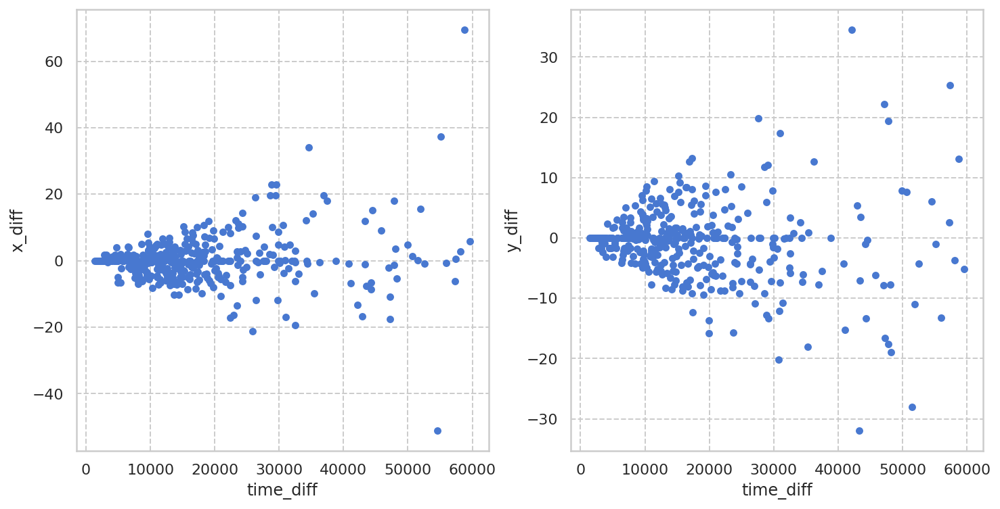

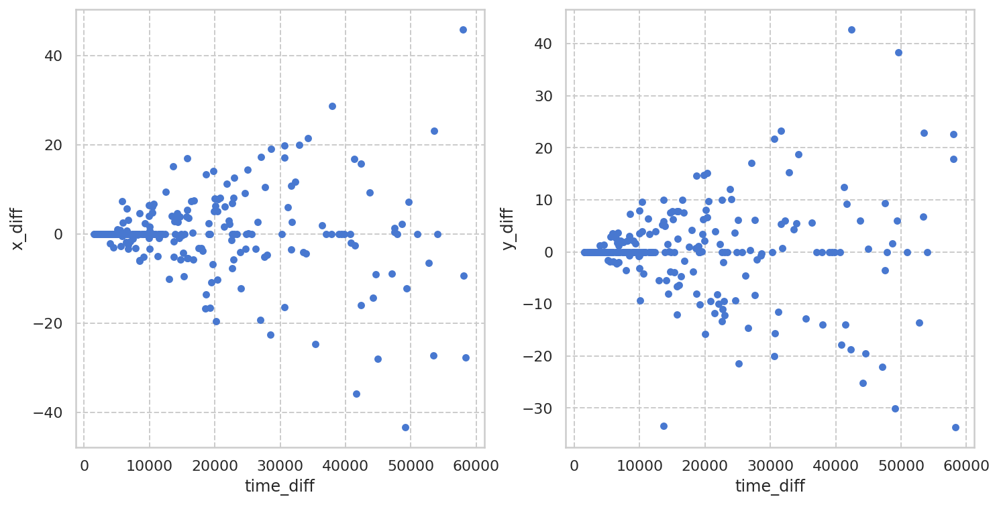

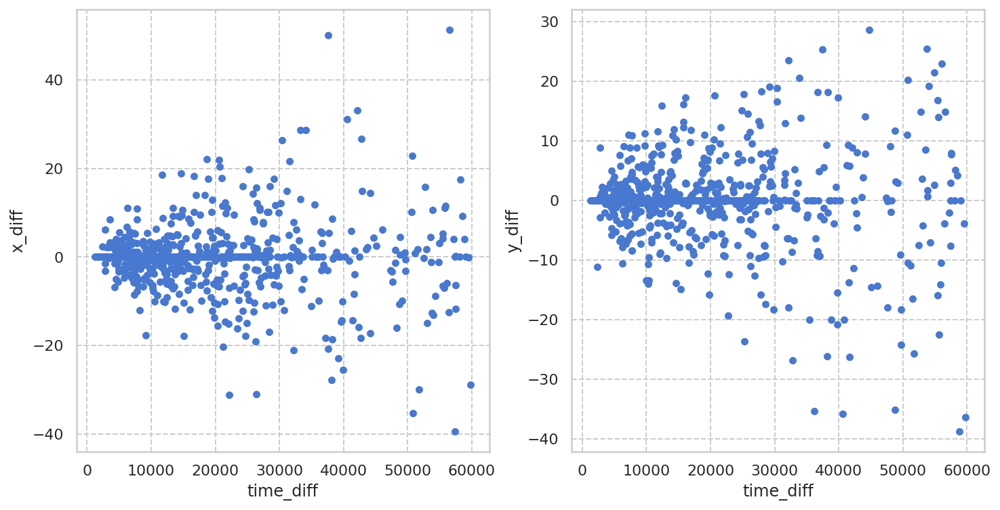

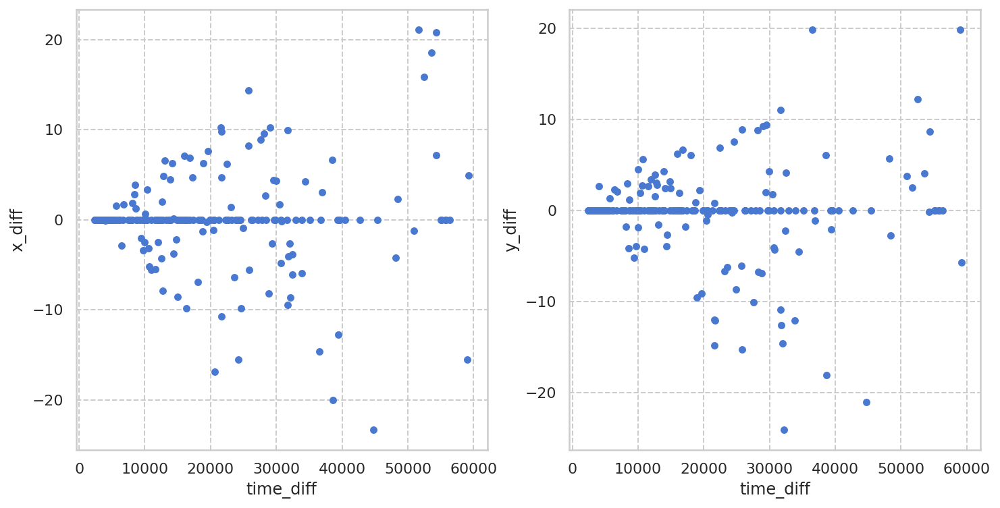

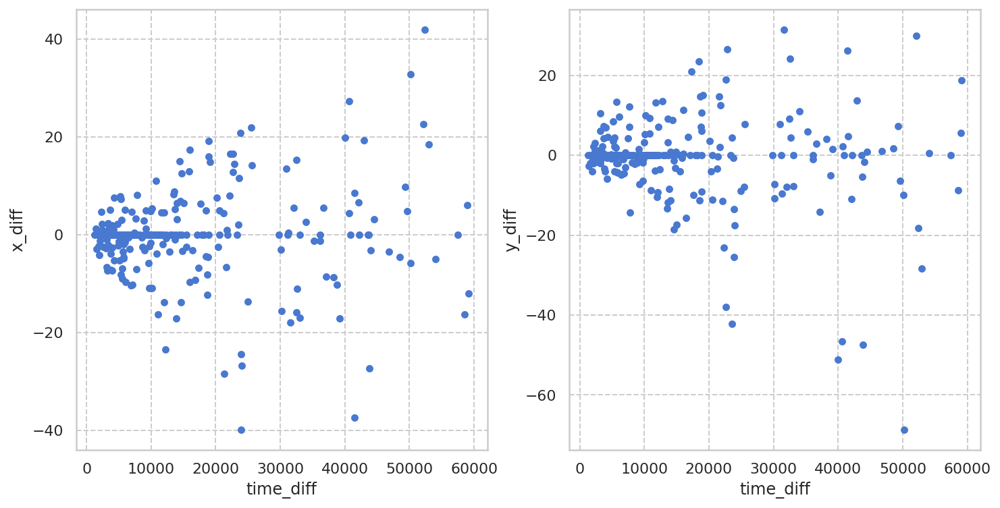

...

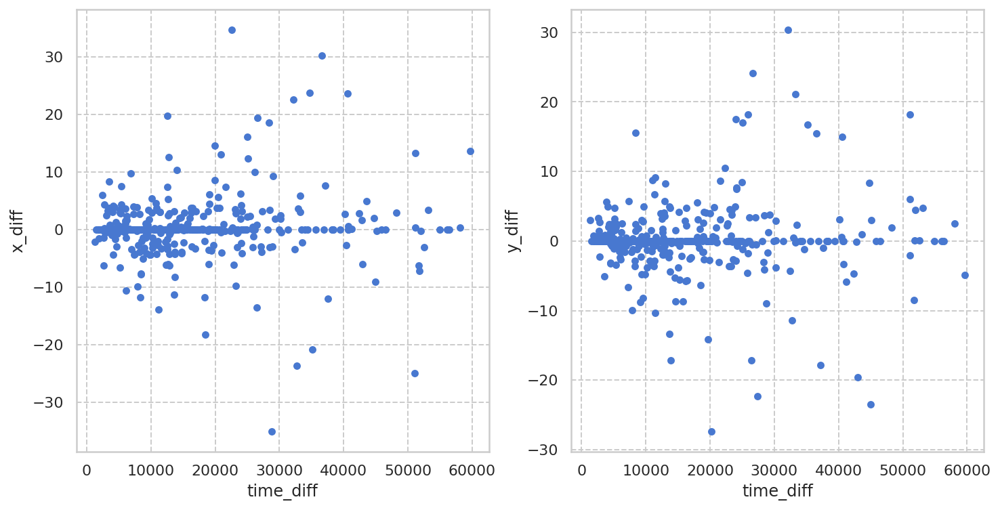

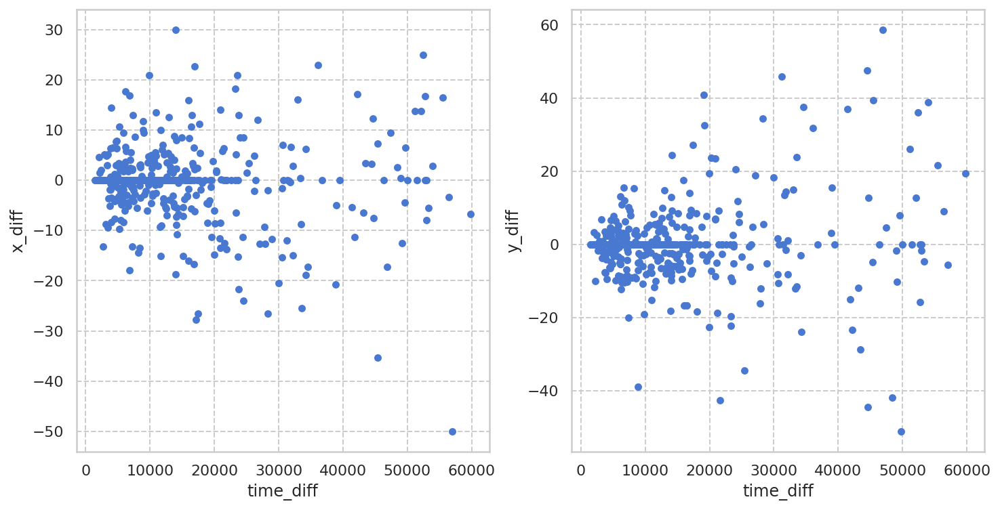

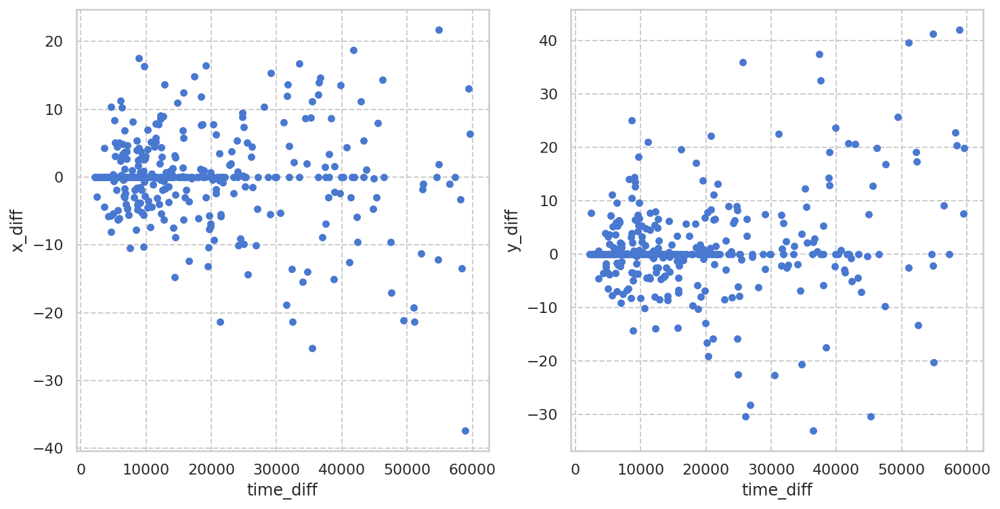

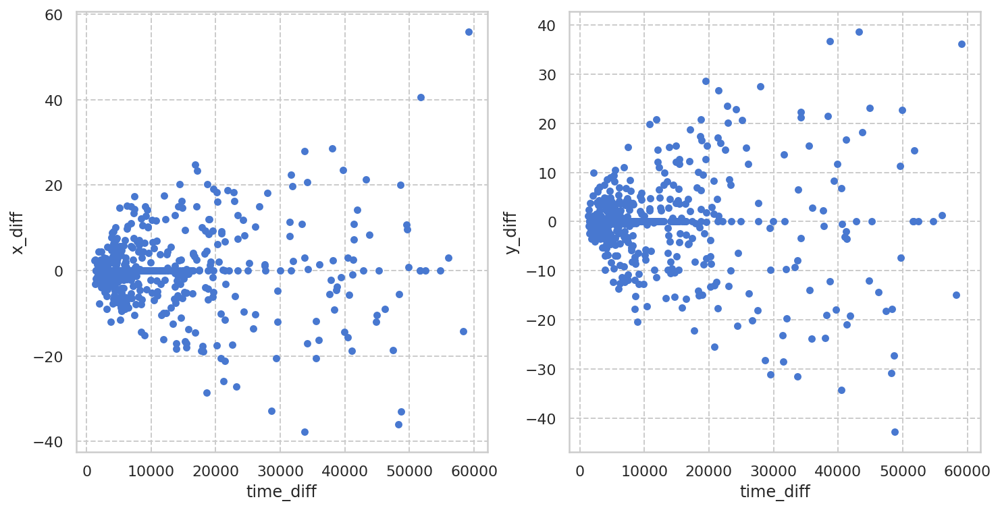

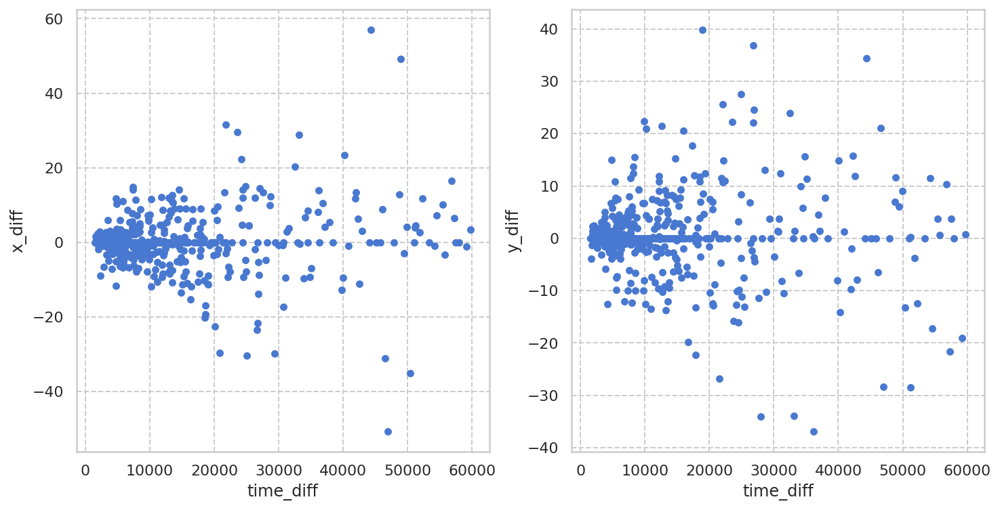

In [20]:
# make train data for each site
df_leak = pd.DataFrame()
for site_id in tqdm(list_site):
    print(site_id)
    ## train
    list_train_files = glob(f"../input/indoor-location-navigation/train/{site_id}/**/*.txt", recursive = True)
    l_pid = []
    l_sts = []
    l_ets = []
    l_swpx = []
    l_swpy = []
    l_ewpx = []
    l_ewpy = []
    l_d = []
    for filename in tqdm(list_train_files):
        path_id = filename.split(".")[2].split("/")[6]
        try: df_all = read_data_file(filename)
        except:continue
        
        # get start and end timestamp
        sts = df_all.starttime
        ets = df_all.endtime
        
        df_waypoint = pd.DataFrame(df_all.waypoint)
        df_waypoint.columns = ['timestamp', 'waypoint_x','waypoint_y']
        df_waypoint["timestamp"] = (df_waypoint["timestamp"]).astype(float)
        
        # search start and end waypoints of each path
        swpx = df_waypoint.query("timestamp == @df_waypoint.timestamp.min()")["waypoint_x"].iloc[0]
        swpy = df_waypoint.query("timestamp == @df_waypoint.timestamp.min()")["waypoint_y"].iloc[0]
        ewpx = df_waypoint.query("timestamp == @df_waypoint.timestamp.max()")["waypoint_x"].iloc[0]
        ewpy = df_waypoint.query("timestamp == @df_waypoint.timestamp.max()")["waypoint_y"].iloc[0]

        # search device id besed on magn bias
        d = sum(df_all.magn_uncali[0,4:7])
        if d == 0:d = sum(df_all.magn_uncali[0,1:4] - df_all.magn[0,1:4])
        d = round(d,2)

        l_pid += [path_id]
        l_sts += [sts]
        l_ets += [ets]
        l_swpx += [swpx]
        l_swpy += [swpy]
        l_ewpx += [ewpx]
        l_ewpy += [ewpy]
        l_d += [d]        
        
    df_mart_train = pd.DataFrame(data={"path_id": l_pid,
                                       "start_time": l_sts, "end_time": l_ets,
                                       "start_waypoint_x": l_swpx, "start_waypoint_y": l_swpy,
                                       "end_waypoint_x": l_ewpx, "end_waypoint_y": l_ewpy,
                                       "device": l_d},
                                 columns=["path_id","start_time","end_time","start_waypoint_x","start_waypoint_y",
                                          "end_waypoint_x", "end_waypoint_y", "device"])

    l_pid = []
    l_sts = []
    l_ets = []
    l_swpx = []
    l_swpy = []
    l_ewpx = []
    l_ewpy = []
    l_d = []
    
    ## test
    df_sample_site = df_sample.query("site_id == @site_id")
    df_sample_site["timestamp"] = df_sample_site["timestamp"].astype(float)
    list_path = df_sample_site["path_id"].unique()
    for path_id in tqdm(list_path):
        df_sample_path = df_sample_site.query("path_id == @path_id")
        filename = f"../input/indoor-location-navigation/test/{path_id}.txt"
        df_all = read_data_file(filename)
        df_wifi = pd.DataFrame(df_all.wifi)
        df_wifi.columns = ['timestamp', 'ssid', 'bssid', 'rssi', 'last_seen_timestamp']
        df_wifi["timestamp"] = (df_wifi["timestamp"]).astype(float)
        df_wifi["last_seen_timestamp"] = (df_wifi["last_seen_timestamp"]).astype(float)  
        
        df_ibeacon = pd.DataFrame(df_all.ibeacon)
        # retrieve raw timestamp
        if len(df_ibeacon) > 0:
            df_ibeacon.columns = ['timestamp', 'uuid', 'rssi', 'dist','last_seen_timestamp']
            df_ibeacon["timestamp"] = (df_ibeacon["timestamp"]).astype(float)
            df_ibeacon["last_seen_timestamp"] = (df_ibeacon["last_seen_timestamp"]).astype(float)
            time_diff = df_ibeacon.loc[0,"last_seen_timestamp"]-df_ibeacon.loc[0,"timestamp"]
        else:
            time_diff = (df_wifi["last_seen_timestamp"] - df_wifi["timestamp"]).max()
            
        # search device id besed on magn bias
        d = sum(df_all.magn_uncali[0,4:7])
        if d == 0:d = sum(df_all.magn_uncali[0,1:4] - df_all.magn[0,1:4])
        d = round(d,2)
        
        sts = df_all.starttime + time_diff
        ets = df_all.endtime + time_diff
        swpx = np.nan;swpy = np.nan; ewpx = np.nan; ewpy = np.nan;floor = np.nan
        # x and y
        df_start = df_mart_train.query("device == @d and start_time > @ets - 2000 and start_time < @ets + 10000").sort_values("start_time").reset_index()
        df_end = df_mart_train.query("device == @d and end_time < @sts + 2000 and end_time > @sts - 10000").sort_values("end_time",ascending=False).reset_index()
        if len(df_start) > 0:
            ewpx = df_start.iloc[0]["start_waypoint_x"]
            ewpy = df_start.iloc[0]["start_waypoint_y"]
        if len(df_end) > 0:
            swpx = df_end.iloc[0]["end_waypoint_x"]
            swpy = df_end.iloc[0]["end_waypoint_y"]

        l_pid += [path_id]
        l_sts += [sts]
        l_ets += [ets]
        l_swpx += [swpx]
        l_swpy += [swpy]
        l_ewpx += [ewpx]
        l_ewpy += [ewpy]
        l_d += [d]    
        
    df_mart_test = pd.DataFrame(data={"path_id": l_pid,
                                       "start_time": df_all.starttime, "end_time": df_all.endtime,
                                       "start_waypoint_x": l_swpx, "start_waypoint_y": l_swpy,
                                       "end_waypoint_x": l_ewpx, "end_waypoint_y": l_ewpy,
                                       "device": l_d},
                                 columns=["path_id","start_time","end_time","start_waypoint_x","start_waypoint_y",
                                          "end_waypoint_x", "end_waypoint_y","device"])
    
    df_leak = df_leak.append(df_mart_test)
    
    # calculate time difference and waypoint difference
    df_tr = df_mart_train.sort_values(["device","start_time"]).reset_index(drop=True)
    df_tr["time_diff"] = df_tr["start_time"] - df_tr.groupby("device").shift(1)["end_time"]
    df_tr["x_diff"] = df_tr["start_waypoint_x"] - df_tr.groupby("device").shift(1)["end_waypoint_x"]
    df_tr["y_diff"] = df_tr["start_waypoint_y"] - df_tr.groupby("device").shift(1)["end_waypoint_y"]
    
    # visualize relationship between time and waypoint differences 
    fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(12, 6))
    _ = df_tr.query("time_diff > -2000 and time_diff < 1000*60").plot.scatter(x="time_diff",y="x_diff",ax=axes[0])
    _ = df_tr.query("time_diff > -2000 and time_diff < 1000*60").plot.scatter(x="time_diff",y="y_diff",ax=axes[1])

    #display(fig)

In [21]:
sub = df_sample.copy()
list_path = sub["path_id"].unique()
for path_id in tqdm(list_path):
    sub_path = sub.query("path_id == @path_id")
    start_idx = sub.loc[sub["path_id"] == path_id].index.min()
    end_idx = sub.loc[sub["path_id"] == path_id].index.max()
    start_x = sub_path.at[start_idx,"x"]
    start_y = sub_path.at[start_idx,"y"]
    end_x = sub_path.at[end_idx,"x"]
    end_y = sub_path.at[end_idx,"y"]
    start_x_leak = df_leak.query("path_id == @path_id")["start_waypoint_x"].iloc[0]
    start_y_leak = df_leak.query("path_id == @path_id")["start_waypoint_y"].iloc[0]
    end_x_leak = df_leak.query("path_id == @path_id")["end_waypoint_x"].iloc[0]
    end_y_leak = df_leak.query("path_id == @path_id")["end_waypoint_y"].iloc[0]
    if not np.isnan(start_x_leak):
        sub.at[start_idx,"x"] = start_x_leak
        sub.at[start_idx,"y"] = start_y_leak
    if not np.isnan(end_x_leak):
        sub.at[end_idx,"x"] = end_x_leak
        sub.at[end_idx,"y"] = end_y_leak

100%|██████████| 626/626 [00:11<00:00, 55.55it/s]


In [22]:
sub.drop(["site_id","path_id","timestamp"],axis=1).to_csv("submission_cm_s2g_leak.csv",index = False)

# visualization

In [23]:
# set your submission file here
pred_df = sub_pp.copy()

In [24]:
pred_df['site'] = [s1 for s1, s2, s3 in pred_df.site_path_timestamp.str.split('_')]
pred_df['path'] = [s2 for s1, s2, s3 in pred_df.site_path_timestamp.str.split('_')]
pred_df['timestamp'] = [s3 for s1, s2, s3 in pred_df.site_path_timestamp.str.split('_')]

In [25]:
#https://www.kaggle.com/kenmatsu4/feature-store-for-indoor-location-navigation

class SiteInfo():
    def __init__(self, site_id, floor, input_path="../input/indoor-location-navigation/"):
        self.site_id = site_id
        self.floor = floor
        self.input_path = input_path
        assert Path(input_path).exists(), f"input_path do not exist: {input_path}"
        
    def get_site_info(self, keep_raw=False):
        floor_info_path = f"{self.input_path}/metadata/{self.site_id}/{self.floor}/floor_info.json"
        with open(floor_info_path, "r") as f:
            self.floor_info = json.loads(f.read())
            self.site_height = self.floor_info["map_info"]["height"]
            self.site_width = self.floor_info["map_info"]["width"]
            if not keep_raw:
                del self.floor_info
            
        geojson_map_path = f"{self.input_path}/metadata/{self.site_id}/{self.floor}/geojson_map.json"
        with open(geojson_map_path, "r") as f:
            self.geojson_map = json.loads(f.read())
            self.map_type = self.geojson_map["type"]
            self.features = self.geojson_map["features"]
            
            self.floor_coordinates = self.features[0]["geometry"]["coordinates"]
            self.store_coordinates = [self.features[i]["geometry"]["coordinates"] 
                                          for i in range(1, len(self.features))]
                
            if not keep_raw:
                del self.geojson_map
    
    def show_site_image(self):
        path = f"{self.input_path}/metadata/{self.site_id}/{self.floor}/floor_image.png"
        plt.imshow(imread(path), extent=[0, self.site_width, 0, self.site_height])

    def draw_polygon(self, size=8, only_floor=False):

        fig = plt.figure()
        ax = plt.subplot(111)
            
        xmax, xmin, ymax, ymin = self._draw(self.floor_coordinates, ax, calc_minmax=True)
        if not only_floor:
            self._draw(self.store_coordinates, ax, fill=True)
        plt.legend([])
        
        xrange = xmax - xmin
        yrange = ymax - ymin
        ratio = yrange / xrange
        
        self.x_size = size
        self.y_size = size*ratio

        fig.set_figwidth(size)
        fig.set_figheight(size*ratio)
        # plt.show()
        return ax
        
    def _draw(self, coordinates, ax, fill=False, calc_minmax=False):
        xmax, ymax = -np.inf, -np.inf
        xmin, ymin = np.inf, np.inf
        for i in range(len(coordinates)):
            ndim = np.ndim(coordinates[i])
            if ndim==2:
                corrd_df = pd.DataFrame(coordinates[i])
                if fill:
                    ax.fill(corrd_df[0], corrd_df[1], alpha=0.7)
                else:
                    corrd_df.plot.line(x=0, y=1, style="-", ax=ax)
                        
                if calc_minmax:
                    xmax = max(xmax, corrd_df[0].max())
                    xmin = min(xmin, corrd_df[0].min())

                    ymax = max(ymax, corrd_df[1].max())
                    ymin = min(ymin, corrd_df[1].min())
            elif ndim==3:
                for j in range(len(coordinates[i])):
                    corrd_df = pd.DataFrame(coordinates[i][j])
                    if fill:
                        ax.fill(corrd_df[0], corrd_df[1], alpha=0.6)
                    else:
                        corrd_df.plot.line(x=0, y=1, style="-", ax=ax)
                        
                    if calc_minmax:
                        xmax = max(xmax, corrd_df[0].max())
                        xmin = min(xmin, corrd_df[0].min())

                        ymax = max(ymax, corrd_df[1].max())
                        ymin = min(ymin, corrd_df[1].min())
            else:
                assert False, f"ndim of coordinates should be 2 or 3: {ndim}"
        if calc_minmax:
            return xmax, xmin, ymax, ymin
        else:
            return None
        

In [26]:
floor_convert = {'1F' :  0, '2F' : 1, '3F' : 2, '4F' : 3, '5F' : 4, 
                     '6F' : 5, '7F' : 6, '8F' : 7, '9F' : 8,
                     'B'  : -1, 'B1' : -1, 'B2' : -2, 'B3' : -3, 
                     'BF' : -1, 'BM' : -1, 
                     'F1' : 0, 'F2' : 1, 'F3' : 2, 'F4' : 3, 'F5' : 4, 
                     'F6' : 5, 'F7' : 6, 'F8' : 7, 'F9' : 8, 'F10': 9,
                     'L1' : 0, 'L2' : 1, 'L3' : 2, 'L4' : 3, 'L5' : 4, 
                     'L6' : 5, 'L7' : 6, 'L8' : 7, 'L9' : 8, 'L10': 9, 
                     'L11': 10,
                     'G'  : 0, 'LG1': 0, 'LG2': 1, 'LM' : 0, 'M'  : 0, 
                     'P1' : 0, 'P2' : 1,}

In [27]:
reconv = {}

for i in range(20):
    reconv[i - 5] = []
    
for k, v in floor_convert.items(): 
    reconv[v].append(k) 

In [28]:
#https://www.kaggle.com/hiro5299834/indoor-navigation-and-location-wifi-features
train_dir='../input/indoor-navigation-and-location-wifi-features/' # v3

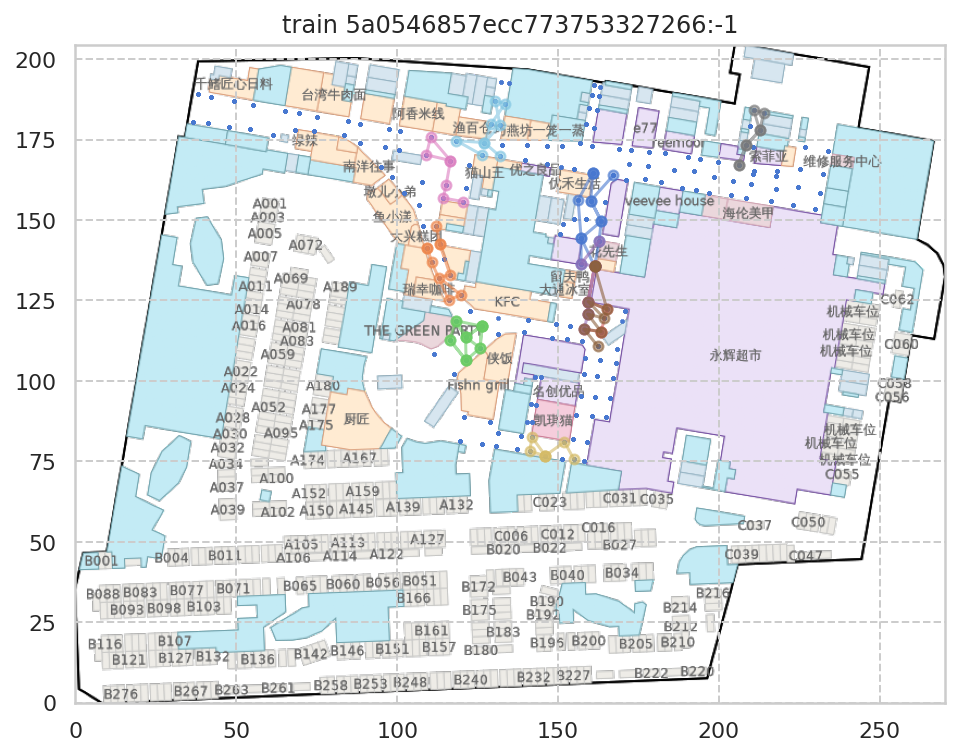

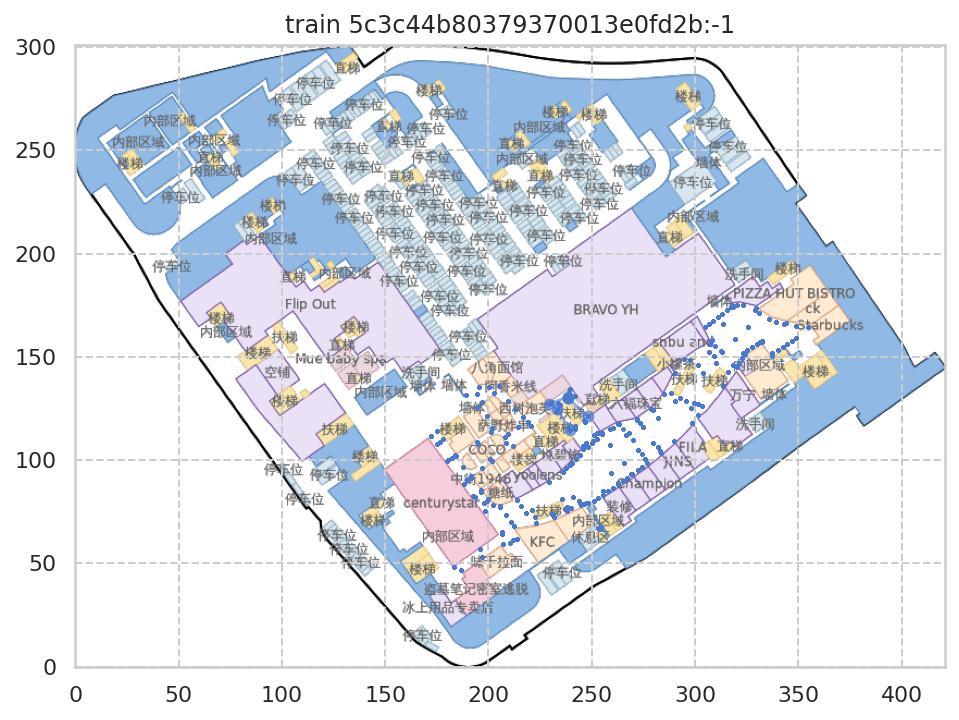

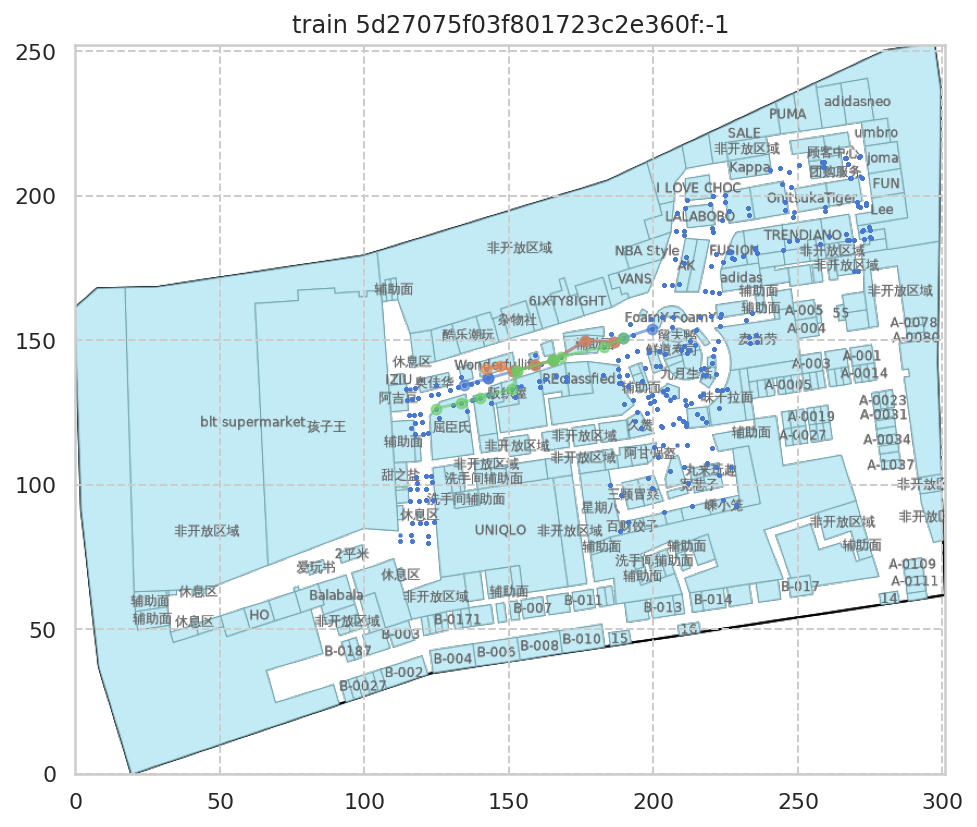

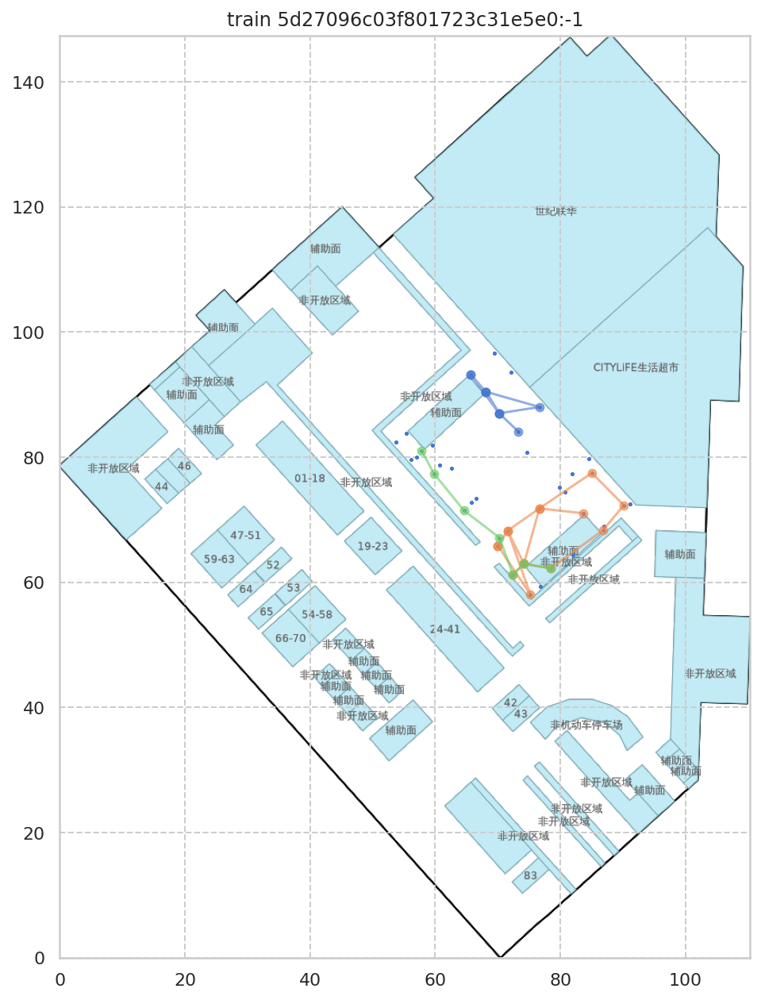

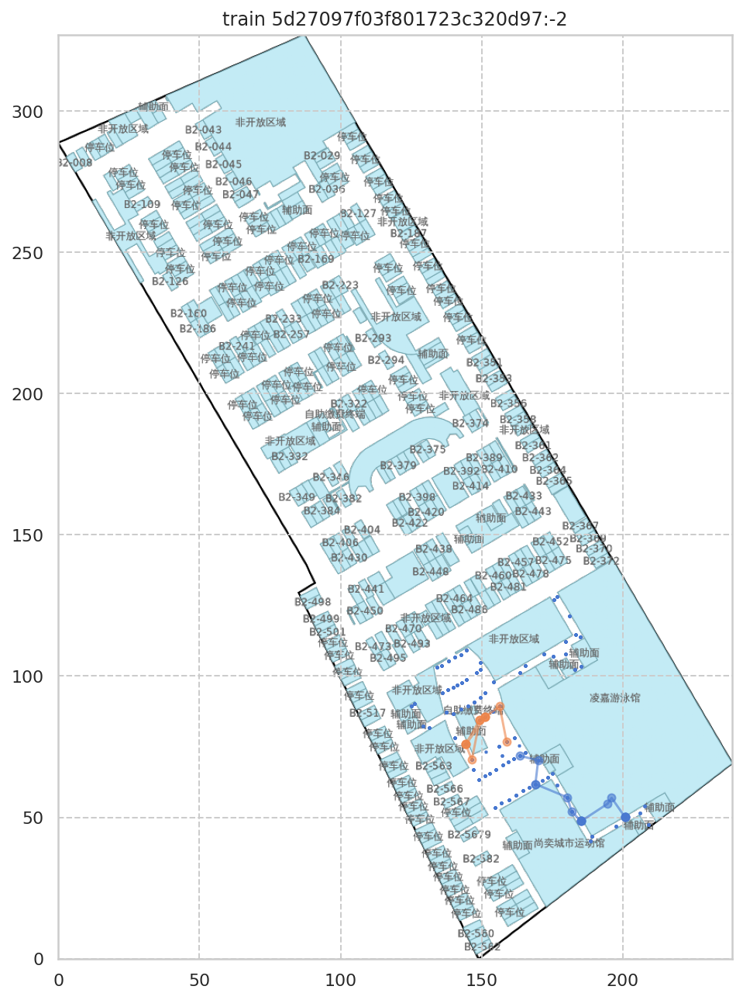

...

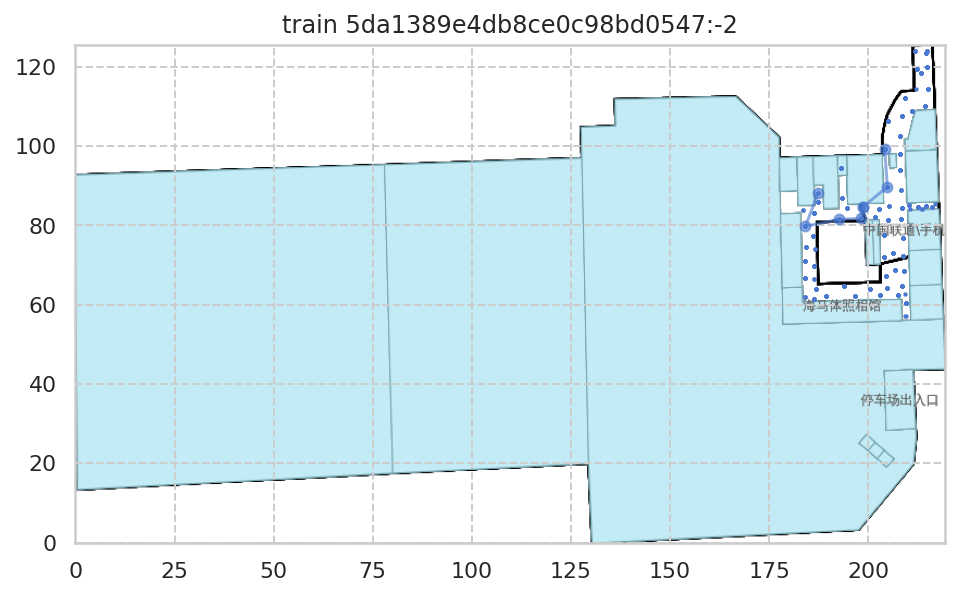

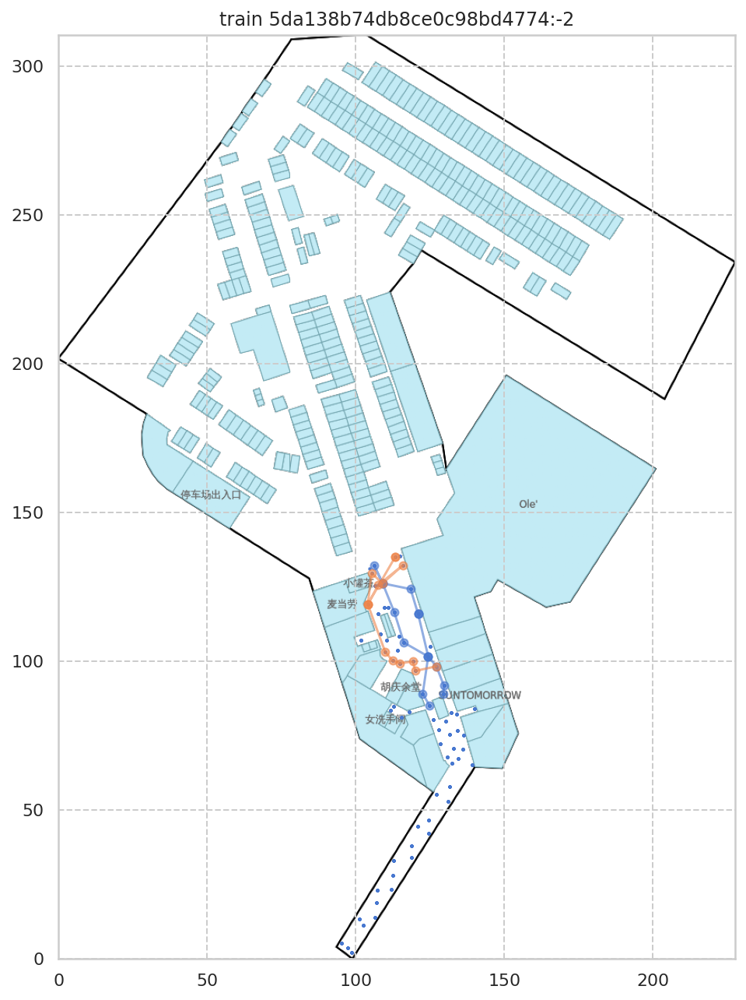

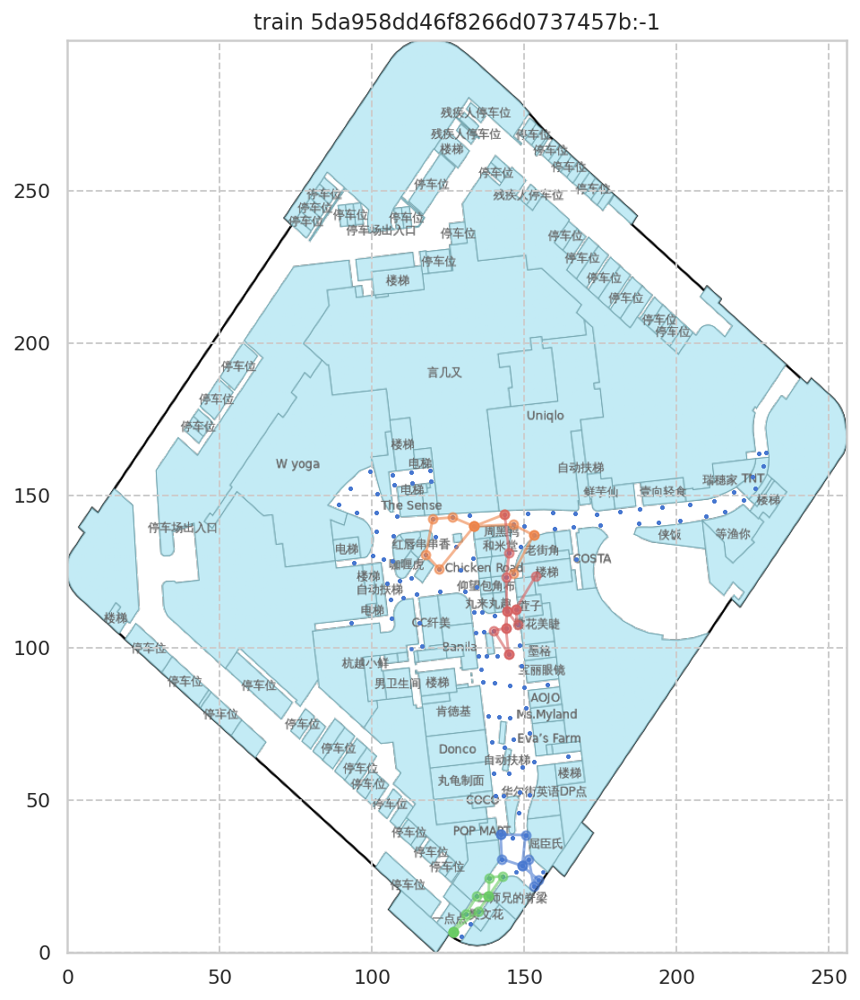

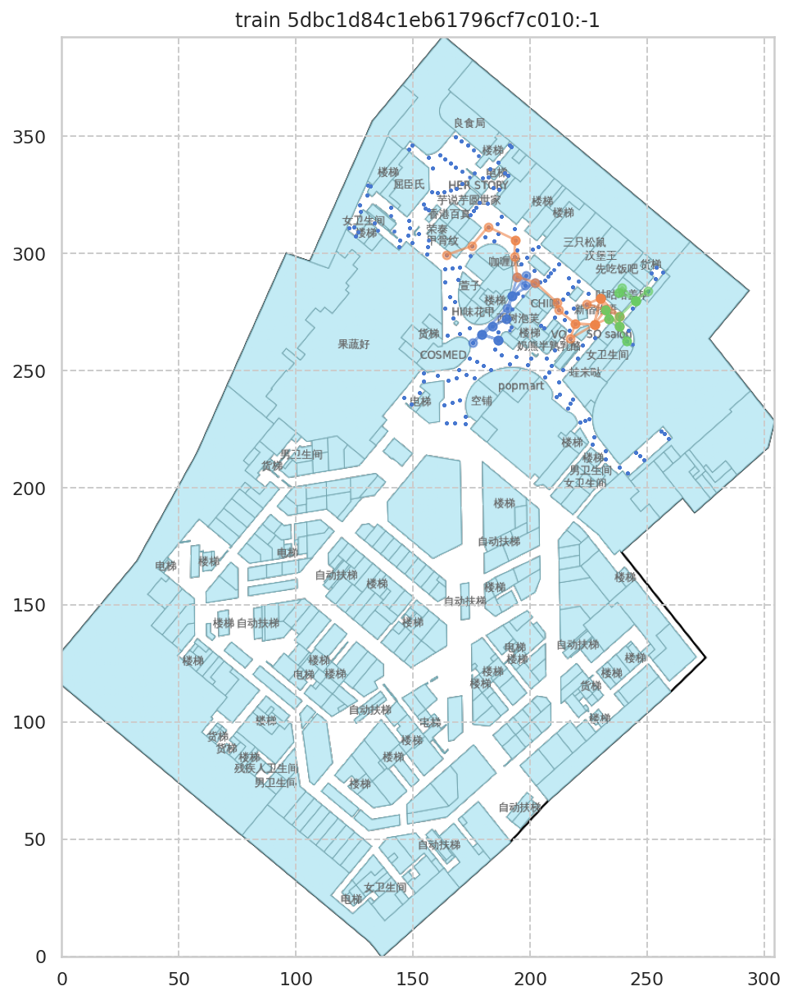

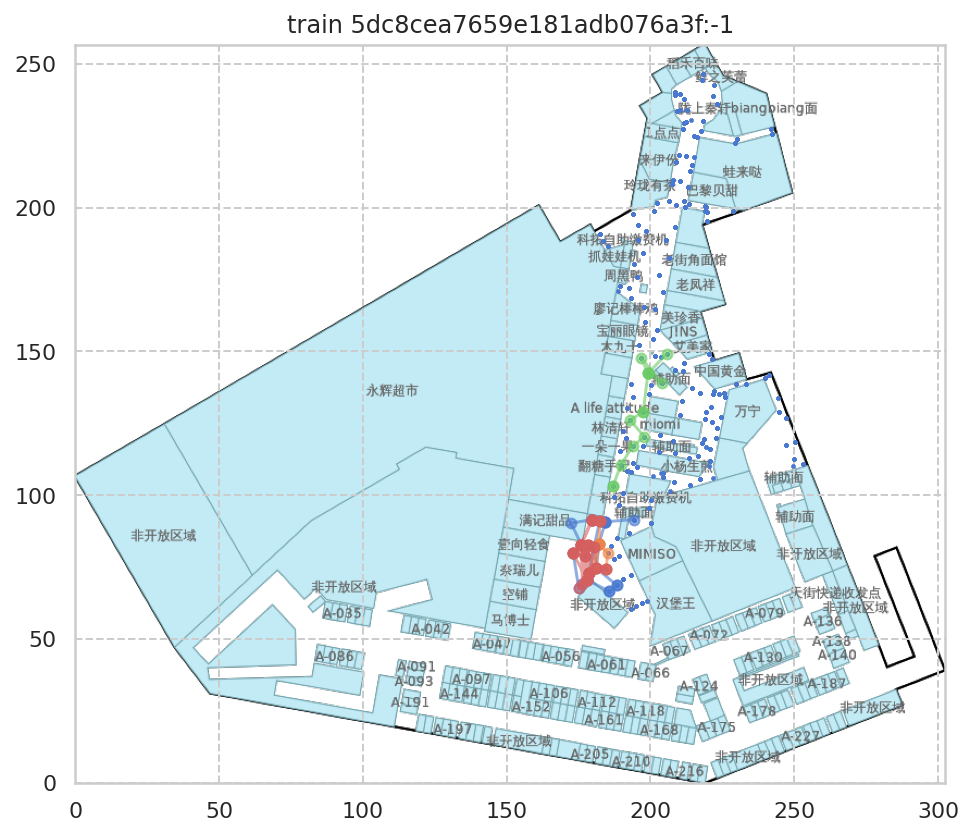

In [29]:
for i, site_id in enumerate(pred_df.site.unique()):

    sample_df = pred_df.query("site == @site_id")
    train_df = pd.read_csv(f'{train_dir}/{site_id}_train.csv')
    
    for floor_id in sample_df['floor'].unique():
        floor_df = sample_df[sample_df['floor'] == floor_id].reset_index(drop=True)

        for fstr in reconv[floor_id]:
            sample_map = SiteInfo(site_id, fstr)
            try:
                sample_map.get_site_info()
            except:
                pass
            else:
                break

        plt.figure(figsize=(8, 8*sample_map.site_height / sample_map.site_width))
        #plt.subplot(121)
        
        sample_map.show_site_image()

        for _, g in floor_df.groupby("path"):
            plt.plot(g.x, g.y, "-o", alpha=0.6,  zorder=100, markersize=5 )
            
#        plt.title(f'pred {site_id}:{floor_id}')
        
        sample_train = train_df.query('f == @floor_id')
        
#        plt.subplot(122)
#        sample_map.show_site_image()
        
        #for _, g in sample_train.groupby("path"):
        #    plt.plot(g.x, g.y, "-o", alpha=0.6,  zorder=100, markersize=5)
        
        plt.scatter(sample_train.x, sample_train.y, marker='+', s=3)
        plt.title(f'train {site_id}:{floor_id}')
        
        # show all floor in this site
        break 
    #break